# Kiểm tra và trực quan hóa SROIE Original → Clean

Notebook này không sửa dữ liệu. Nó cho phép xem bằng mắt các ảnh trùng/leak, lỗi OCR/KIE trong `Original`, các quyết định làm sạch và kiểm tra lại `Clean`. Hãy chạy **Run All** từ trên xuống.

In [1]:
from pathlib import Path
from collections import defaultdict
import hashlib
import json
import re

from PIL import Image, ImageDraw, ImageFont, ImageOps
from IPython.display import display

def find_project_root():
    for candidate in (Path.cwd(), *Path.cwd().parents):
        if (candidate / 'dataset' / 'SROIE' / 'Original').is_dir():
            return candidate
    raise FileNotFoundError('Không tìm thấy dataset/SROIE/Original')

PROJECT_ROOT = find_project_root()
ORIGINAL = PROJECT_ROOT / 'dataset' / 'SROIE' / 'Original'
CLEAN = PROJECT_ROOT / 'dataset' / 'SROIE' / 'Clean'
TRAIN_OCR = ORIGINAL / '0325updated.task1train(626p)'
TRAIN_KIE = ORIGINAL / '0325updated.task2train(626p)'
TEST_IMAGES = ORIGINAL / 'task1&2_test(361p)'
TEST_OCR = ORIGINAL / 'text.task1&2-test（361p)'
TASK3_IMAGES = ORIGINAL / 'task3-test 347p) -' / 'task3-test（347p)'
print('Original:', ORIGINAL)
print('Clean:', CLEAN)

Original: /home/ubuntu/Documents/HK1/Computer_Vision_and_Applications/project/dataset/SROIE/Original
Clean: /home/ubuntu/Documents/HK1/Computer_Vision_and_Applications/project/dataset/SROIE/Clean


In [2]:
def font(size=18):
    path = Path('/usr/share/fonts/truetype/dejavu/DejaVuSans.ttf')
    return ImageFont.truetype(str(path), size) if path.exists() else ImageFont.load_default()

def sha256(path):
    digest = hashlib.sha256()
    with path.open('rb') as handle:
        for chunk in iter(lambda: handle.read(1024 * 1024), b''):
            digest.update(chunk)
    return digest.hexdigest()

def show_sheet(items, columns=2, cell_width=520, cell_height=620):
    rows = (len(items) + columns - 1) // columns
    sheet = Image.new('RGB', (columns * cell_width, rows * cell_height), 'white')
    draw = ImageDraw.Draw(sheet)
    title_font = font(17)
    for index, (image, title) in enumerate(items):
        row, column = divmod(index, columns)
        x0, y0 = column * cell_width, row * cell_height
        preview = ImageOps.contain(image.convert('RGB'), (cell_width - 20, cell_height - 80))
        sheet.paste(preview, (x0 + (cell_width - preview.width) // 2, y0 + 70))
        draw.multiline_text((x0 + 8, y0 + 7), title, fill='black', font=title_font, spacing=3)
        draw.rectangle((x0, y0, x0 + cell_width - 1, y0 + cell_height - 1), outline='#AAAAAA', width=2)
    display(sheet)
    return sheet

def decode_original_ocr(path):
    raw = path.read_bytes()
    for encoding in ('utf-8-sig', 'gb18030', 'cp1252'):
        try:
            return raw.decode(encoding), encoding
        except UnicodeDecodeError:
            pass
    raise UnicodeDecodeError('unknown', raw, 0, 1, 'Không giải mã được')

def parse_ocr(path, keep_blank=False):
    text, encoding = decode_original_ocr(path)
    records = []
    for line_number, line in enumerate(text.splitlines(), 1):
        if not line.strip():
            if keep_blank:
                records.append({'line': line_number, 'blank': True})
            continue
        parts = line.split(',', 8)
        if len(parts) != 9:
            records.append({'line': line_number, 'malformed': line})
            continue
        records.append({'line': line_number, 'bbox': [int(v) for v in parts[:8]], 'text': parts[8]})
    return records, encoding

def draw_ocr(image_path, annotation_path, highlight_text=None, highlight_line=None):
    image = Image.open(image_path).convert('RGB')
    records, _ = parse_ocr(annotation_path)
    draw = ImageDraw.Draw(image)
    width = max(2, min(image.size) // 250)
    for record in records:
        if 'bbox' not in record:
            continue
        coords = record['bbox']
        selected = record['text'] == highlight_text and (highlight_line is None or record['line'] == highlight_line)
        color = '#FF0000' if selected else '#00AEEF'
        points = list(zip(coords[0::2], coords[1::2]))
        xs, ys = coords[0::2], coords[1::2]
        if max(xs) > min(xs) and max(ys) > min(ys):
            draw.line(points + [points[0]], fill=color, width=width * (2 if selected else 1))
        elif selected:
            x, y = coords[0], coords[1]
            radius = max(16, min(image.size) // 35)
            draw.line((x-radius, y-radius, x+radius, y+radius), fill=color, width=width*2)
            draw.line((x-radius, y+radius, x+radius, y-radius), fill=color, width=width*2)
        if selected:
            draw.text((max(0, min(xs)), max(0, min(ys)-30)), f"Dòng {record['line']}: {record['text']} {coords}", fill=color, font=font(max(16, min(image.size)//55)), stroke_width=2, stroke_fill='white')
    return image

## 1. Cấu trúc Original và file phiên bản lặp

Các file có hậu tố `(1)`, `(2)…` là bản lặp. Bản Clean chỉ lấy 626 stem không có hậu tố.

In [3]:
variant = re.compile(r'\(\d+\)$')
directories = {
    'train task 1': TRAIN_OCR,
    'train task 2': TRAIN_KIE,
    'test images task 1&2': TEST_IMAGES,
    'test OCR': TEST_OCR,
    'test images task 3': TASK3_IMAGES,
}
for name, directory in directories.items():
    jpg = list(directory.glob('*.jpg'))
    txt = list(directory.glob('*.txt'))
    print(f"{name:23s} jpg={len(jpg):3d} txt={len(txt):3d} | canonical jpg={sum(not variant.search(p.stem) for p in jpg):3d} txt={sum(not variant.search(p.stem) for p in txt):3d}")

train task 1            jpg=712 txt=835 | canonical jpg=626 txt=626
train task 2            jpg=735 txt=876 | canonical jpg=626 txt=626
test images task 1&2    jpg=360 txt=  0 | canonical jpg=360 txt=  0
test OCR                jpg=  0 txt=361 | canonical jpg=  0 txt=361
test images task 3      jpg=347 txt=  0 | canonical jpg=347 txt=  0


## 2. Ảnh trùng trong split và leak train → test

Mỗi cặp dưới đây có SHA-256 giống hệt nhau. Tên `KEEP` được giữ, tên `REMOVE` bị loại. Với leak train–test, luôn giữ test và loại train.

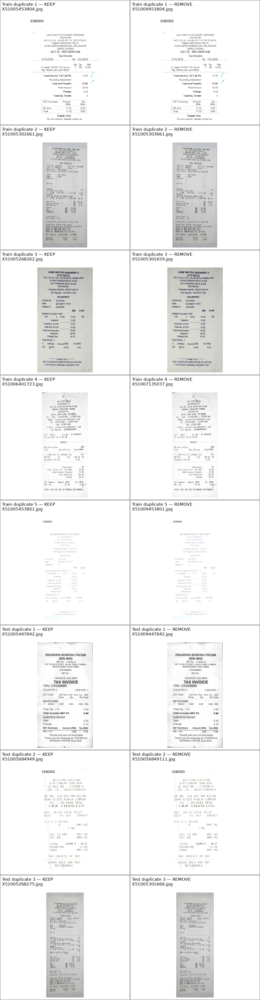

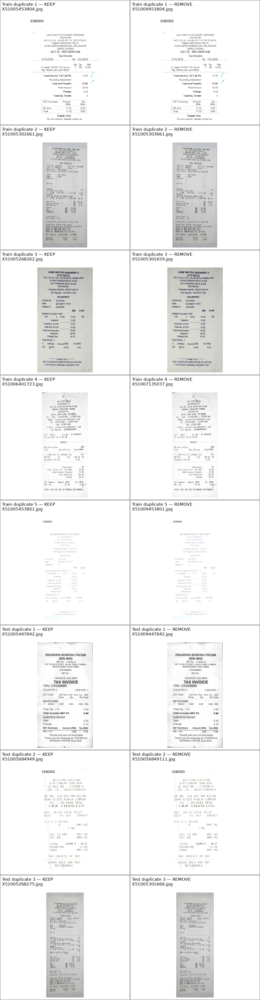

In [4]:
TRAIN_DUPLICATES = [
    ('X51005453804', 'X51009453804'), ('X51005301661', 'X51005303661'),
    ('X51005268262', 'X51005301659'), ('X51006401723', 'X51007135037'),
    ('X51005453801', 'X51009453801'),
]
TEST_DUPLICATES = [
    ('X51005447842', 'X51009447842'), ('X51005684949', 'X510056849111'),
    ('X51005268275', 'X51005301666'),
]
LEAKS = [
    ('X51006008095', 'X51009008095'), ('X51006332575', 'X51006328967'),
    ('X51005453729', 'X51009453729'), ('X51007135247', 'X51006401853'),
    ('X51006008091', 'X51009008091'), ('X51006328913', 'X51006329388'),
    ('X51005568881', 'X51009568881'), ('X51006329399', 'X51006328937'),
]

visuals = []
for split_name, root, pairs in [('Train duplicate', TRAIN_OCR, TRAIN_DUPLICATES), ('Test duplicate', TEST_IMAGES, TEST_DUPLICATES)]:
    for group, (kept, removed) in enumerate(pairs, 1):
        assert sha256(root/f'{kept}.jpg') == sha256(root/f'{removed}.jpg')
        visuals.append((Image.open(root/f'{kept}.jpg').convert('RGB'), f'{split_name} {group} — KEEP\n{kept}.jpg'))
        visuals.append((Image.open(root/f'{removed}.jpg').convert('RGB'), f'{split_name} {group} — REMOVE\n{removed}.jpg'))
show_sheet(visuals, columns=2, cell_height=500)

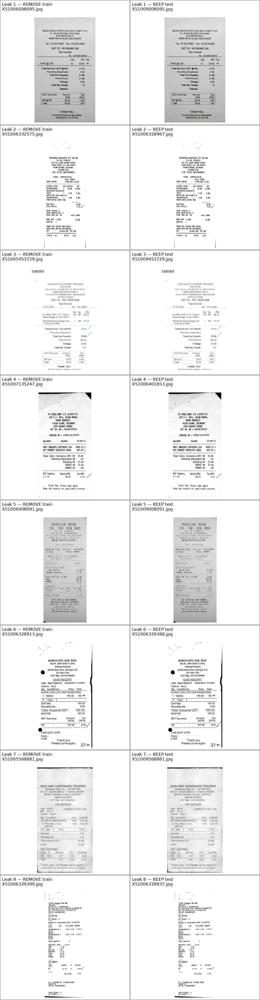

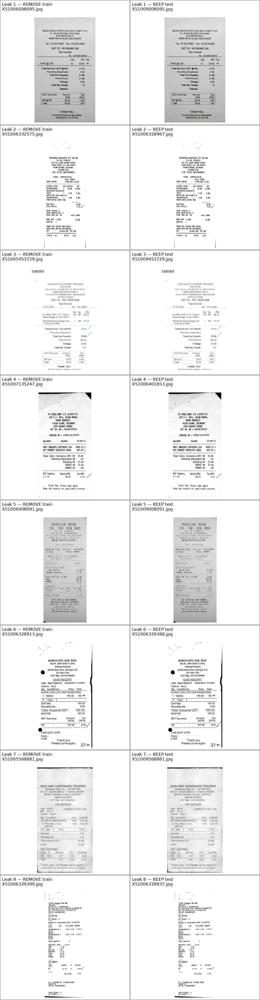

In [5]:
leak_visuals = []
for group, (train_stem, test_stem) in enumerate(LEAKS, 1):
    train_path, test_path = TRAIN_OCR/f'{train_stem}.jpg', TEST_IMAGES/f'{test_stem}.jpg'
    assert sha256(train_path) == sha256(test_path)
    leak_visuals.append((Image.open(train_path).convert('RGB'), f'Leak {group} — REMOVE train\n{train_stem}.jpg'))
    leak_visuals.append((Image.open(test_path).convert('RGB'), f'Leak {group} — KEEP test\n{test_stem}.jpg'))
show_sheet(leak_visuals, columns=2, cell_height=500)

## 3. Lỗi OCR trước và sau khi sửa

Màu đỏ là annotation cần chú ý. Bản Clean clamp hai bbox chạm biên và gán lại bbox `TOTAL RM` dựa trên vùng chữ nhìn thấy.

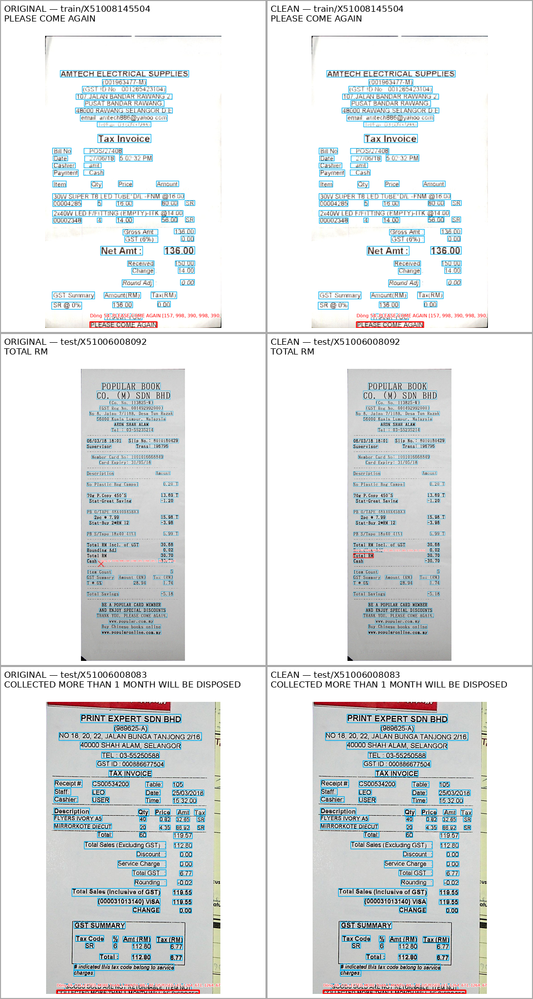

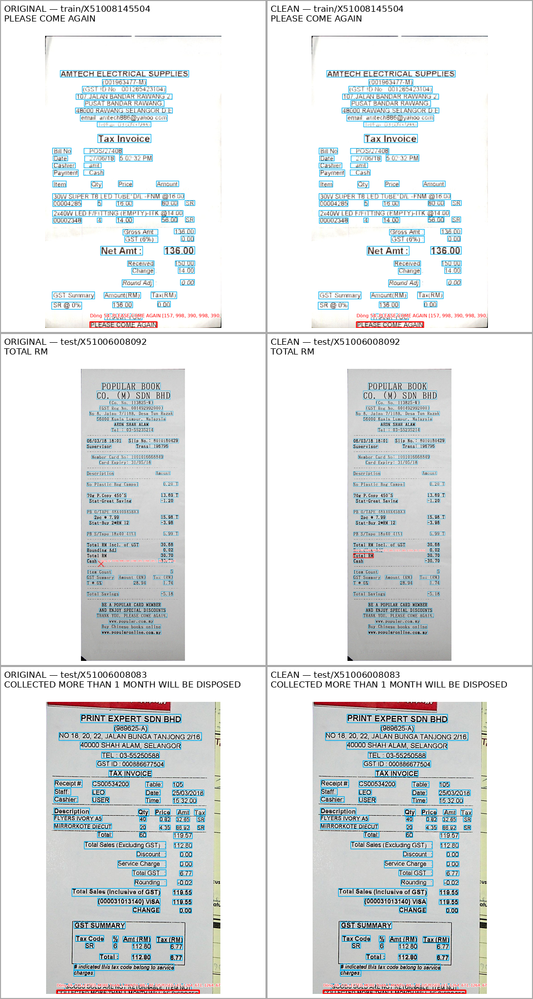

In [6]:
problem_specs = [
    ('train', 'X51008145504', 'PLEASE COME AGAIN', 54),
    ('test', 'X51006008092', 'TOTAL RM', 32),
    ('test', 'X51006008083', 'COLLECTED MORE THAN 1 MONTH WILL BE DISPOSED', 69),
]
problem_visuals = []
for split, stem, text_value, line in problem_specs:
    original_image_root = TRAIN_OCR if split == 'train' else TEST_IMAGES
    original_ocr_root = TRAIN_OCR if split == 'train' else TEST_OCR
    problem_visuals.append((draw_ocr(original_image_root/f'{stem}.jpg', original_ocr_root/f'{stem}.txt', text_value, line), f'ORIGINAL — {split}/{stem}\n{text_value}'))
    problem_visuals.append((draw_ocr(CLEAN/split/'images'/f'{stem}.jpg', CLEAN/split/'ocr'/f'{stem}.txt', text_value), f'CLEAN — {split}/{stem}\n{text_value}'))
show_sheet(problem_visuals, columns=2, cell_height=650)

In [7]:
blank_records, _ = parse_ocr(TEST_OCR/'X51006328967.txt', keep_blank=True)
print('Dòng trống trong Original:', [r['line'] for r in blank_records if r.get('blank')])
print('Dòng trống trong Clean:', [i for i, line in enumerate((CLEAN/'test/ocr/X51006328967.txt').read_text(encoding='utf-8').splitlines(), 1) if not line.strip()])

original_text, original_encoding = decode_original_ocr(TEST_OCR/'X51006619503.txt')
clean_text = (CLEAN/'test/ocr/X51006619503.txt').read_text(encoding='utf-8')
print('Encoding nhận diện để đọc Original:', original_encoding)
print('Dòng ký tự đặc biệt Original:', [line for line in original_text.splitlines() if 'KEPONG BARU' in line][0])
print('Dòng UTF-8 trong Clean:', [line for line in clean_text.splitlines() if 'KEPONG BARU' in line][0])

missing_stem = 'X51006619570'
print('Ảnh thiếu trong test Original:', not (TEST_IMAGES/f'{missing_stem}.jpg').exists())
print('Ảnh có trong task 3:', (TASK3_IMAGES/f'{missing_stem}.jpg').exists())
print('Ảnh đã khôi phục trong Clean:', (CLEAN/'test/images'/f'{missing_stem}.jpg').exists())

Dòng trống trong Original: [50]
Dòng trống trong Clean: []
Encoding nhận diện để đọc Original: gb18030
Dòng ký tự đặc biệt Original: 328,583,573,583,573,620,328,620,KEPONG BARU，
Dòng UTF-8 trong Clean: 328,583,573,583,573,620,328,620,KEPONG BARU，
Ảnh thiếu trong test Original: True
Ảnh có trong task 3: True
Ảnh đã khôi phục trong Clean: True


## 4. Hai lỗi ground truth KIE

`X51005663280` không in địa chỉ nên Clean dùng chuỗi rỗng, không suy diễn `KLCC` thành địa chỉ. `X51005433522` hiển thị rõ tổng tiền `$8.20` nên Clean điền `8.20`.

X51005663280
  Original: {'company': 'T.A.S LEISURE SDN BHD', 'date': '30 DEC 17', 'total': '102.40'}
  Clean   : {'company': 'T.A.S LEISURE SDN BHD', 'date': '30 DEC 17', 'total': '102.40', 'address': ''}
X51005433522
  Original: {'company': 'UNIHAKKA INTERNATIONAL SDN BHD', 'date': '10 MAR 2018', 'address': '12, JALAN TAMPOI 7/4,KAWASAN PERINDUSTRIAN TAMPOI,81200 JOHOR BAHRU,JOHOR', 'total': ''}
  Clean   : {'company': 'UNIHAKKA INTERNATIONAL SDN BHD', 'date': '10 MAR 2018', 'address': '12, JALAN TAMPOI 7/4,KAWASAN PERINDUSTRIAN TAMPOI,81200 JOHOR BAHRU,JOHOR', 'total': '8.20'}


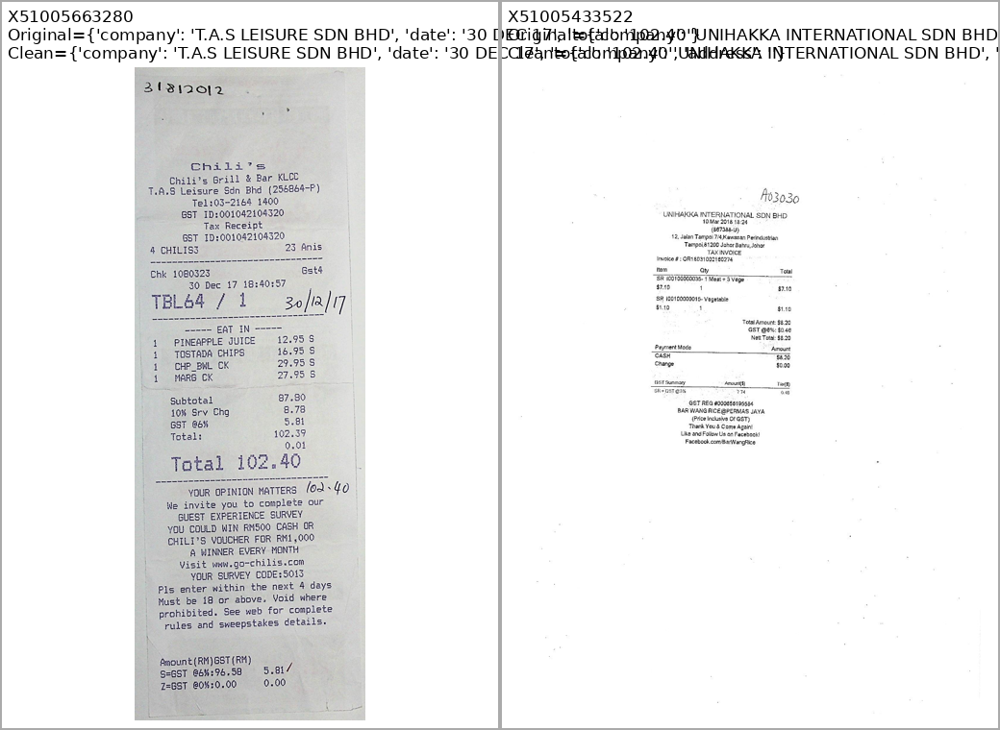

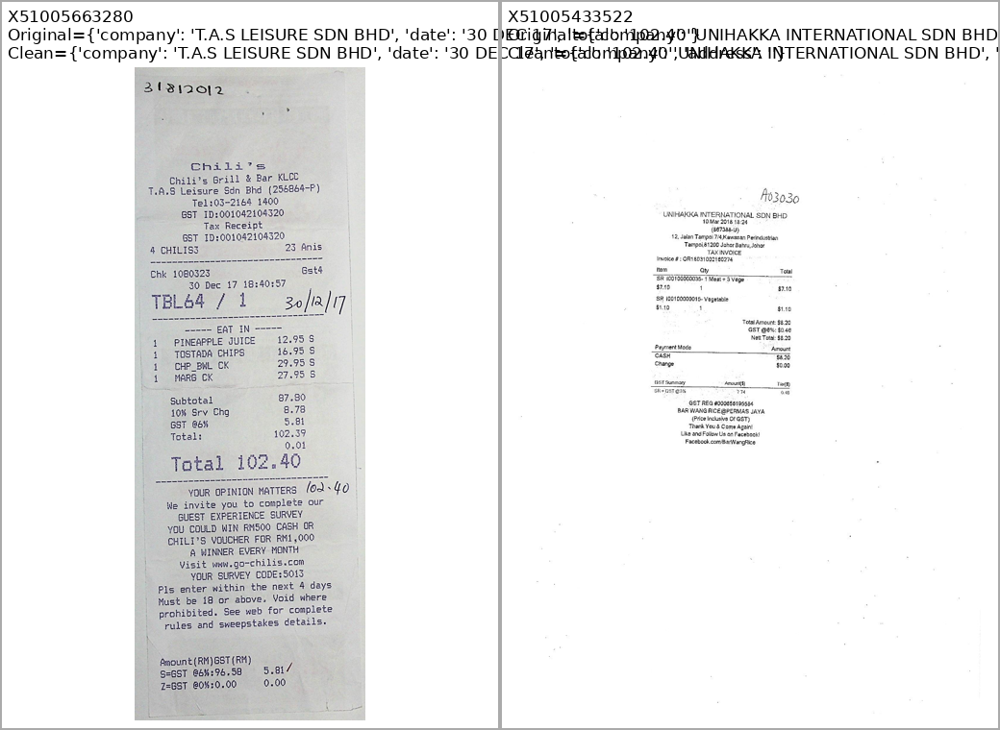

In [8]:
kie_visuals = []
for stem in ('X51005663280', 'X51005433522'):
    original_kie = json.loads((TRAIN_KIE/f'{stem}.txt').read_text(encoding='utf-8-sig'))
    clean_kie = json.loads((CLEAN/'train/kie'/f'{stem}.json').read_text(encoding='utf-8'))
    print(stem)
    print('  Original:', original_kie)
    print('  Clean   :', clean_kie)
    kie_visuals.append((Image.open(TRAIN_OCR/f'{stem}.jpg').convert('RGB'), f"{stem}\nOriginal={original_kie}\nClean={clean_kie}"))
show_sheet(kie_visuals, columns=2, cell_height=760)

## 5. Kiểm tra độc lập bộ Clean

Ô cuối xác nhận pairing, encoding UTF-8, bbox hợp lệ, KIE đúng schema và không còn ảnh trùng/leak.

In [9]:
def audit_clean_split(split):
    image_root, ocr_root = CLEAN/split/'images', CLEAN/split/'ocr'
    images = {p.stem: p for p in image_root.glob('*.jpg')}
    annotations = {p.stem: p for p in ocr_root.glob('*.txt')}
    assert set(images) == set(annotations)
    hashes = {}
    line_count = 0
    for stem, image_path in images.items():
        digest = sha256(image_path)
        assert digest not in hashes, (stem, hashes.get(digest))
        hashes[digest] = stem
        with Image.open(image_path) as image:
            width, height = image.size
        text = annotations[stem].read_text(encoding='utf-8')
        assert all(line.strip() for line in text.splitlines())
        for line in text.splitlines():
            parts = line.split(',', 8)
            assert len(parts) == 9
            coords = [int(v) for v in parts[:8]]
            xs, ys = coords[0::2], coords[1::2]
            assert 0 <= min(xs) <= max(xs) < width
            assert 0 <= min(ys) <= max(ys) < height
            assert max(xs) > min(xs) and max(ys) > min(ys)
            line_count += 1
    return images, hashes, line_count

train_images, train_hashes, train_lines = audit_clean_split('train')
test_images, test_hashes, test_lines = audit_clean_split('test')
assert not (set(train_hashes) & set(test_hashes))
kie = {p.stem: p for p in (CLEAN/'train/kie').glob('*.json')}
assert set(kie) == set(train_images)
for path in kie.values():
    item = json.loads(path.read_text(encoding='utf-8'))
    assert set(item) == {'company', 'date', 'address', 'total'}
    assert all(isinstance(value, str) for value in item.values())
print('Train:', len(train_images), 'ảnh |', train_lines, 'dòng OCR |', len(kie), 'KIE JSON')
print('Test :', len(test_images), 'ảnh |', test_lines, 'dòng OCR')
print('Ảnh trùng trong từng split: 0')
print('Leak train–test: 0')
print('BBox suy biến/ngoài ảnh: 0')
print('File OCR không phải UTF-8 hoặc có dòng trống: 0')

Train: 613 ảnh | 32995 dòng OCR | 613 KIE JSON
Test : 358 ảnh | 19223 dòng OCR
Ảnh trùng trong từng split: 0
Leak train–test: 0
BBox suy biến/ngoài ảnh: 0
File OCR không phải UTF-8 hoặc có dòng trống: 0
